<a href="https://colab.research.google.com/github/AdamClarkStandke/GenerativeDeepLearning/blob/main/LatentSpaceGifMaker.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install keras-cv==0.6.0 -q
!pip install -U tensorflow -q
!pip install keras-core -q

from textwrap import wrap
import os
import keras_cv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow.experimental.numpy as tnp
from keras_cv.models.stable_diffusion.clip_tokenizer import SimpleTokenizer
from keras_cv.models.stable_diffusion.diffusion_model import DiffusionModel
from keras_cv.models.stable_diffusion.image_encoder import ImageEncoder
from keras_cv.models.stable_diffusion.noise_scheduler import NoiseScheduler
from keras_cv.models.stable_diffusion.text_encoder import TextEncoder
from tensorflow import keras
from keras_core import ops
from PIL import Image
import math

def export_as_gif(filename, images, frames_per_second=30, rubber_band=False):
    if rubber_band:
        images += images[2:-1][::-1]
    images[0].save(
        filename,
        save_all=True,
        append_images=images[1:],
        duration=1000 // frames_per_second,
        loop=0,
    )

def plot_grid(images, path, grid_size, scale=2):
    fig, axs = plt.subplots(
        grid_size, grid_size, figsize=(grid_size * scale, grid_size * scale)
    )
    fig.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.axis("off")
    for ax in axs.flat:
        ax.axis("off")

    images = images.astype(int)
    for i in range(min(grid_size * grid_size, len(images))):
        ax = axs.flat[i]
        ax.imshow(images[i].astype("uint8"))
        ax.axis("off")

    for i in range(len(images), grid_size * grid_size):
        axs.flat[i].axis("off")
        axs.flat[i].remove()

    plt.savefig(
        fname=path,
        pad_inches=0,
        bbox_inches="tight",
        transparent=False,
        dpi=60,
    )

def downsample(images, half=0.5):
  half = 0.5
  down_size = []
  for i in range(0, len(images)):
    size = [int(half * s) for s in images[i].size]
    down_size.append(images[i].resize(size))
  return down_size

# Enable mixed precision
# (only do this if you have a recent NVIDIA GPU)
keras.mixed_precision.set_global_policy("mixed_float16")

# Instantiate the Stable Diffusion model
model = keras_cv.models.StableDiffusion(jit_compile=True)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.3/756.3 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 9.4 MB/s eta 0:00:00
Using TensorFlow backend
By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


In [ ]:
num_text_prompts=4 #@param { type: "integer" }
text_promp = "A boy with circle | girl with circle| dog eating cheese | dog eating string" #@param { type: "string" }
interpolation_steps = 6 #@param { type: "integer" }
batch_size = 3 #@param { type: "integer" }
NUM_STEPS = 25 #@param { type: "integer" }
ending = ".gif"
FILENAME= "stuff" #@param { type: "string" }
save = FILENAME + ending
stores = []
seed = 12345
noise = tf.random.normal((512 // 8, 512 // 8, 4))
FPS = 2 #@param { type: "integer" }

if num_text_prompts > 2:
  batches = interpolation_steps**2 // batch_size
else:
  batches = 1
if num_text_prompts > 1:
  stores = text_promp.split(sep="|")



def interp_steps(encode, steps):
  store= []
  for _ in range(0, len(encode), 2):
    encoding_1 = encode.pop()
    encoding_2 = encode.pop()
    store.append(ops.linspace(encoding_1, encoding_2, steps))
  if len(store) > 1 and num_text_prompts==4:
    x=store.pop()
    y=store.pop()
    return ops.split(ops.reshape(ops.linspace(x, y, steps), (steps**2, 77, 768)), batches)
  else:
    return ops.split(store, batches)

def text_inter(text, steps=1):
  encodings = []
  for i in range(0, len(text)):
    encodings.append(ops.squeeze(model.encode_text(text[i])))
  if len(encodings) < 2:
    return encodings
  elif (len(encodings)%2!=0):
    raise Exception("Prompts have to be a multiple of 2")
  else:
    batch_interp=interp_steps(encodings, steps)
    return batch_interp



encodings = text_inter(stores, interpolation_steps)
if len(encodings) < 2:
  batch_size=1
images = []
for batch in range(batches):
  images += [
        Image.fromarray(img)
        for img in model.generate_image(
            encodings[batch],
            batch_size=batch_size,
            num_steps=NUM_STEPS,
            diffusion_noise=noise,
        )
      ]

if interpolation_steps > 100:
  export_as_gif(save, downsample(images), frames_per_second=FPS ,rubber_band=True)
else:
  export_as_gif(filename=save, images=images, frames_per_second=FPS, rubber_band=True)

25/25 [==============================] - 9s 366ms/step


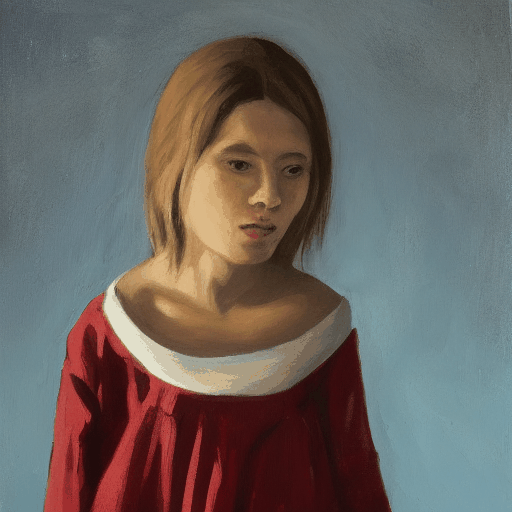

In [ ]:
from IPython.display import Image as IImage
IImage(save)